# Add Noise

    Adding different noise colors to the main audio file.

- White Noise
- Blue Noise
- Pink Noise
- Brown Noise
- ...

In [139]:
# Imports

import librosa
import librosa.display
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import lfilter
from scipy.io import wavfile
from IPython.display import Audio

In [140]:
"""Load Data

    y: audio time series
    sr: sampling rate
"""

y, sr = librosa.load('../Data/mCco09-05.wav', sr=None)


In [141]:
def white_noise(signal):
    return np.random.normal(0, 0.02, size=signal.shape)

In [142]:
def pink_noise(signal):
    """Approximate pink noise using filtering of white noise."""
    white = np.random.normal(0, 1, size=signal.shape)
    # Coefficients for a 1/f filter
    b = [0.049922035, -0.095993537, 0.050612699, -0.004408786]
    a = [1, -2.494956002, 2.017265875, -0.522189400]
    filtered = lfilter(b, a, white)
    if isinstance(filtered, tuple):
        filtered = filtered[0]
    return filtered * 0.02

In [143]:
def brown_noise(signal):
    """Integrate white noise to get brown noise (Brownian noise)."""
    white = np.random.normal(0, 1, size=signal.shape)
    brown = np.cumsum(white)
    brown = brown / np.max(np.abs(brown)) * 0.02
    return brown

In [144]:
def blue_noise(signal):
    """Differentiate white noise to emphasize high frequencies."""
    white = np.random.normal(0, 1, size=signal.shape)
    blue = np.diff(white, prepend=0)
    blue = blue / np.max(np.abs(blue)) * 0.02
    return blue

In [145]:
def purple_noise(signal):
    """Second derivative of white noise: even stronger high-frequency components."""
    white = np.random.normal(0, 1, size=signal.shape)
    purple = np.diff(np.diff(white, prepend=0), prepend=0)
    purple = purple / np.max(np.abs(purple)) * 0.02
    return purple

In [146]:
audio_files = {
    'Original Audio': y,
    'White Noise':  y + white_noise(y),
    'Pink Noise':   y + pink_noise(y),
    'Brown Noise':  y + brown_noise(y),
    'Blue Noise':   y + blue_noise(y),
    'Purple Noise': y + purple_noise(y),
}

In [147]:
for x, i in audio_files.items():
    sf.write(f'../Data/{x}.wav', i, sr)
    

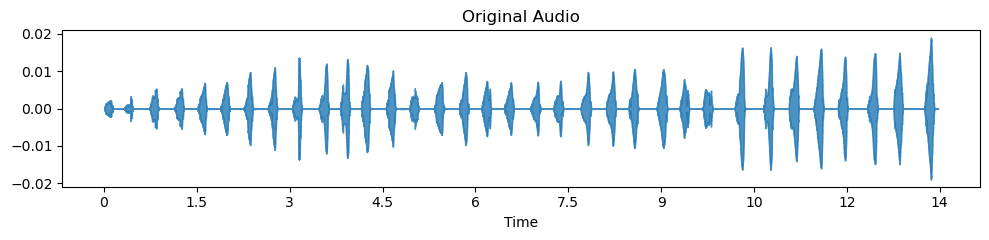

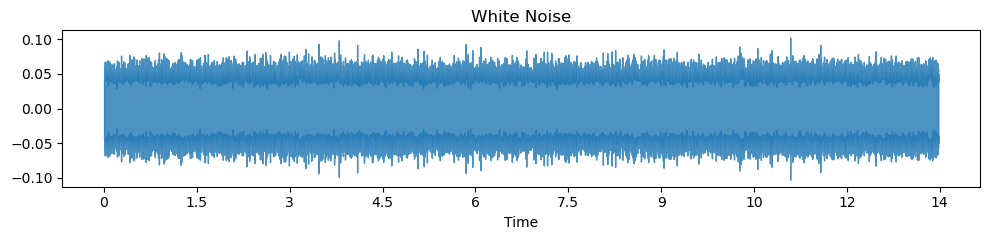

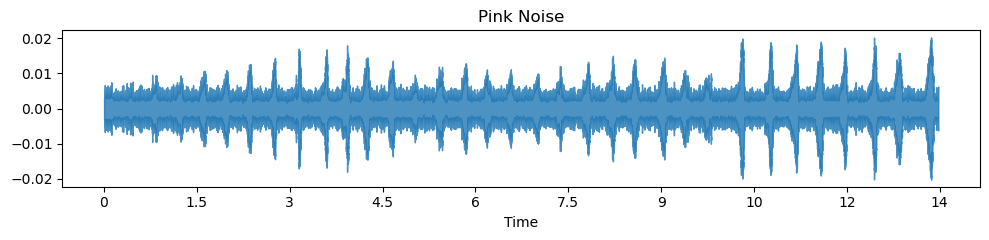

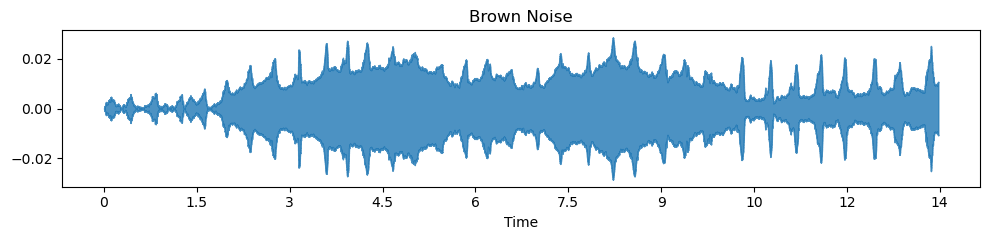

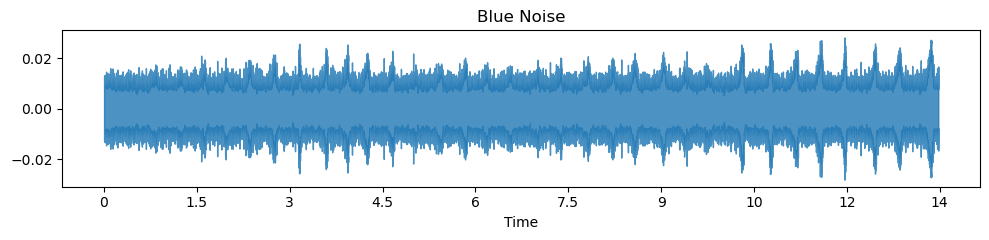

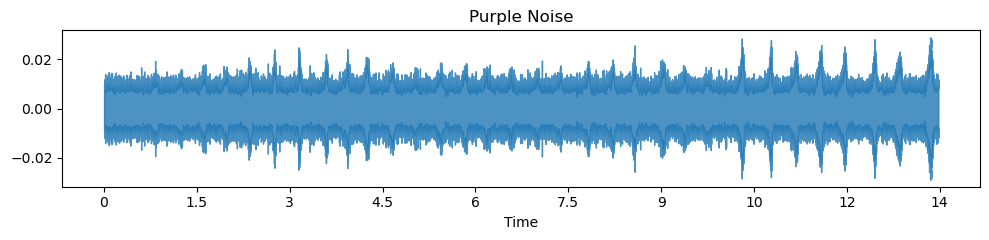

In [148]:
for x, i in audio_files.items():
    
    display(Audio(data=i, rate=sr))
    plt.figure(figsize=(10,2.5))
    librosa.display.waveshow(i, sr=sr, alpha=0.8)
    plt.title(x)
    plt.tight_layout()
    plt.show()
    

